<a href="https://colab.research.google.com/github/KIRTIRAJ4327/30days-AI-challenge/blob/main/Day26_Auto_Captioning_Tool.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

**Core Concept**

Image-to-text generation - This involves using AI to automatically generate descriptive text captions for images.

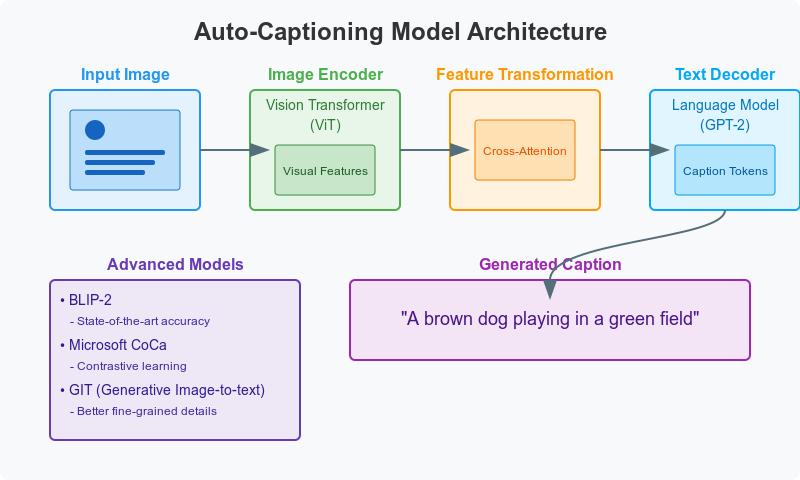

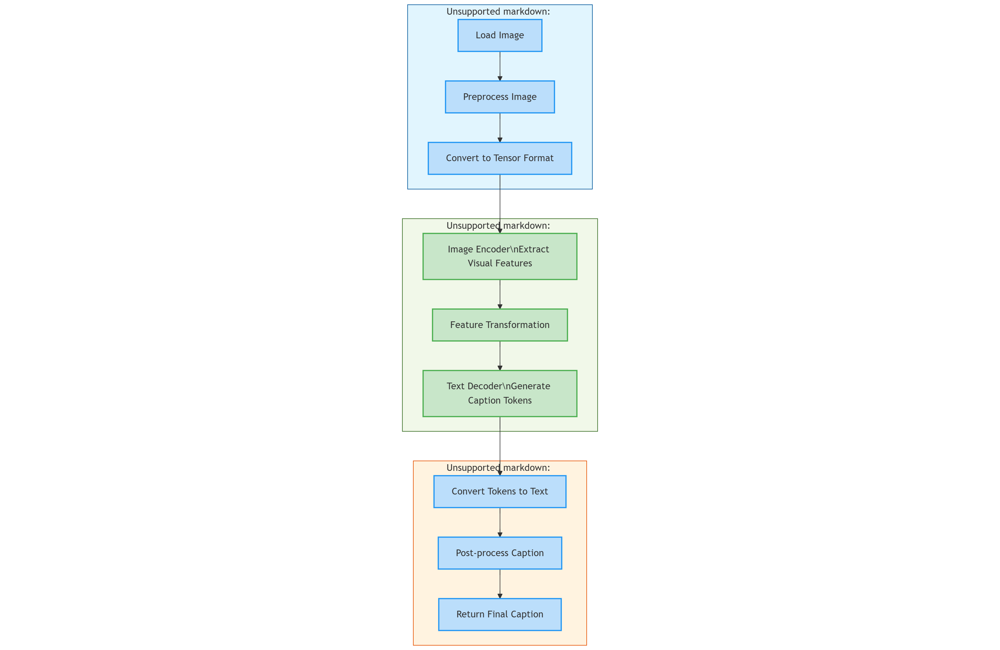

**Install required libraries**

In [1]:
# Install the required libraries
!pip install transformers
!pip install torch
!pip install pillow
!pip install matplotlib

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 2.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 33.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 32.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 43.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 1.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 6.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 12.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 7.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 3.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 41.0 MB/s eta 0:00:00
  Attempting uninstall: nvidia-nvjitlink-cu12
    Found existing installation: nvidia-nvjitlink-cu12 12.5.82
    Uninstalling nvidia-nvjitlink-cu12-12.5.82:
      Successfully uninstalled nvidia-nvjitlin

**Import libraries**

In [2]:
import torch
from transformers import VisionEncoderDecoderModel, ViTImageProcessor, AutoTokenizer
from PIL import Image
import requests
from io import BytesIO
import matplotlib.pyplot as plt

**Load the pre-trained model**

In [3]:
# Load pre-trained models
model = VisionEncoderDecoderModel.from_pretrained("nlpconnect/vit-gpt2-image-captioning")
feature_extractor = ViTImageProcessor.from_pretrained("nlpconnect/vit-gpt2-image-captioning")
tokenizer = AutoTokenizer.from_pretrained("nlpconnect/vit-gpt2-image-captioning")

# Move model to GPU if available
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model.to(device)

/usr/local/lib/python3.11/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


config.json:   0%|          | 0.00/4.61k [00:00<?, ?B/s]

Xet Storage is enabled for this repo, but the 'hf_xet' package is not installed. Falling back to regular HTTP download. For better performance, install the package with: `pip install huggingface_hub[hf_xet]` or `pip install hf_xet`


pytorch_model.bin:   0%|          | 0.00/982M [00:00<?, ?B/s]

Xet Storage is enabled for this repo, but the 'hf_xet' package is not installed. Falling back to regular HTTP download. For better performance, install the package with: `pip install huggingface_hub[hf_xet]` or `pip install hf_xet`


model.safetensors:   0%|          | 0.00/982M [00:00<?, ?B/s]

Config of the encoder: <class 'transformers.models.vit.modeling_vit.ViTModel'> is overwritten by shared encoder config: ViTConfig {
  "architectures": [
    "ViTModel"
  ],
  "attention_probs_dropout_prob": 0.0,
  "encoder_stride": 16,
  "hidden_act": "gelu",
  "hidden_dropout_prob": 0.0,
  "hidden_size": 768,
  "image_size": 224,
  "initializer_range": 0.02,
  "intermediate_size": 3072,
  "layer_norm_eps": 1e-12,
  "model_type": "vit",
  "num_attention_heads": 12,
  "num_channels": 3,
  "num_hidden_layers": 12,
  "patch_size": 16,
  "pooler_act": "tanh",
  "pooler_output_size": 768,
  "qkv_bias": true,
  "torch_dtype": "float32",
  "transformers_version": "4.51.3"
}

Config of the decoder: <class 'transformers.models.gpt2.modeling_gpt2.GPT2LMHeadModel'> is overwritten by shared decoder config: GPT2Config {
  "activation_function": "gelu_new",
  "add_cross_attention": true,
  "architectures": [
    "GPT2LMHeadModel"
  ],
  "attn_pdrop": 0.1,
  "bos_token_id": 50256,
  "decoder_start_to

preprocessor_config.json:   0%|          | 0.00/228 [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/241 [00:00<?, ?B/s]

vocab.json:   0%|          | 0.00/798k [00:00<?, ?B/s]

merges.txt:   0%|          | 0.00/456k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/1.36M [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/120 [00:00<?, ?B/s]

VisionEncoderDecoderModel(
  (encoder): ViTModel(
    (embeddings): ViTEmbeddings(
      (patch_embeddings): ViTPatchEmbeddings(
        (projection): Conv2d(3, 768, kernel_size=(16, 16), stride=(16, 16))
      )
      (dropout): Dropout(p=0.0, inplace=False)
    )
    (encoder): ViTEncoder(
      (layer): ModuleList(
        (0-11): 12 x ViTLayer(
          (attention): ViTAttention(
            (attention): ViTSelfAttention(
              (query): Linear(in_features=768, out_features=768, bias=True)
              (key): Linear(in_features=768, out_features=768, bias=True)
              (value): Linear(in_features=768, out_features=768, bias=True)
            )
            (output): ViTSelfOutput(
              (dense): Linear(in_features=768, out_features=768, bias=True)
              (dropout): Dropout(p=0.0, inplace=False)
            )
          )
          (intermediate): ViTIntermediate(
            (dense): Linear(in_features=768, out_features=3072, bias=True)
            (inte

**Explanation:**


1.   We're using a model that combines ViT (Vision Transformer) for image

1.   understanding and GPT-2 for text generation
2.   The model has been fine-tuned specifically for image captioning


4.   We're also loading the preprocessing tools needed for images and text

5.   We move the model to GPU if available (makes things faster)










**Define a function to generate captions**

In [4]:
def generate_caption(image):
    # Preprocess the image
    pixel_values = feature_extractor(images=[image], return_tensors="pt").pixel_values
    pixel_values = pixel_values.to(device)

    # Generate caption
    output_ids = model.generate(pixel_values, max_length=16, num_beams=4)

    # Decode the output ids to text
    preds = tokenizer.batch_decode(output_ids, skip_special_tokens=True)

    # Return the first prediction (we only have one image)
    return preds[0].strip()

**Explanation:**


1.   This function takes an image and returns a caption

1.   First we convert the image to the format our model expects
2.   Then we generate caption tokens using beam search (a technique to find good captions)


4.   Finally we convert those tokens back to readable text







**Function to load images (either from URL or file)**

In [5]:
def load_image(image_path):
    if image_path.startswith('http'):
        # Load image from URL
        response = requests.get(image_path)
        image = Image.open(BytesIO(response.content))
    else:
        # Load image from local file
        image = Image.open(image_path)

    # Convert to RGB (in case image is RGBA or another format)
    image = image.convert('RGB')
    return image

**Function to display image with caption**

In [6]:
def display_image_with_caption(image, caption):
    plt.figure(figsize=(12, 8))
    plt.imshow(image)
    plt.axis('off')
    plt.title(caption, fontsize=14)
    plt.tight_layout()
    plt.show()

**Test with sample images**

The attention mask is not set and cannot be inferred from input because pad token is same as eos token. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
We strongly recommend passing in an `attention_mask` since your input_ids may be padded. See https://huggingface.co/docs/transformers/troubleshooting#incorrect-output-when-padding-tokens-arent-masked.
You may ignore this warning if your `pad_token_id` (50256) is identical to the `bos_token_id` (50256), `eos_token_id` (50256), or the `sep_token_id` (None), and your input is not padded.


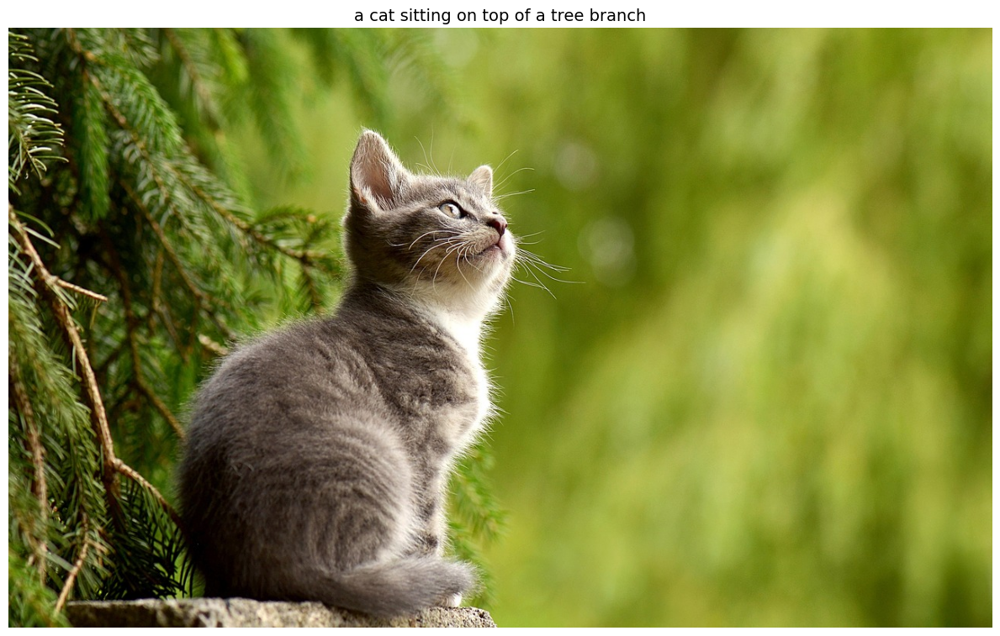

Caption: a cat sitting on top of a tree branch
--------------------------------------------------


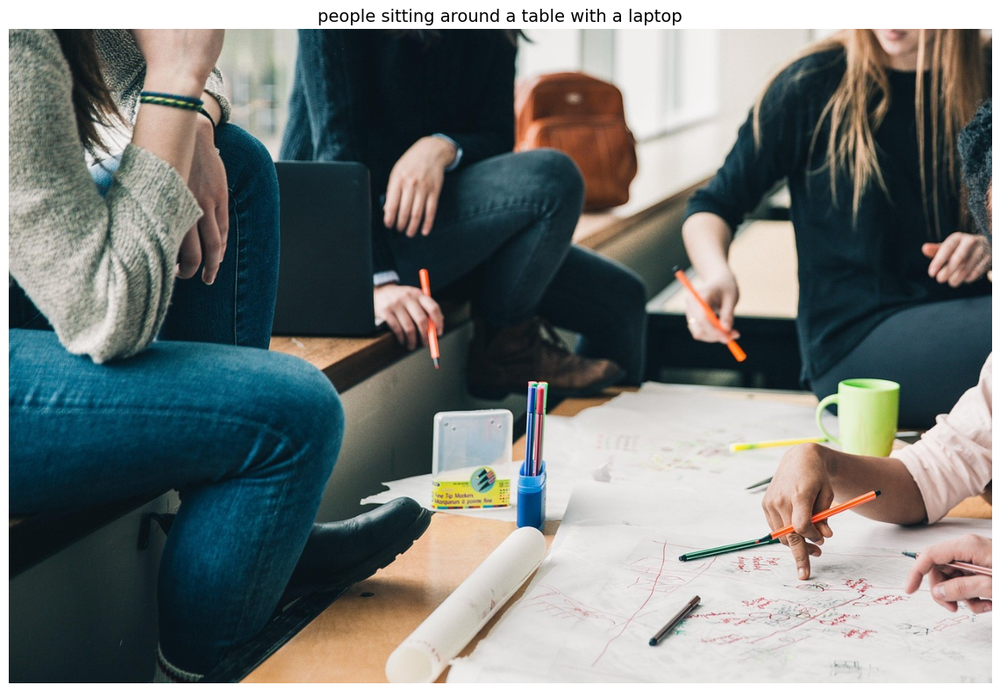

Caption: people sitting around a table with a laptop
--------------------------------------------------


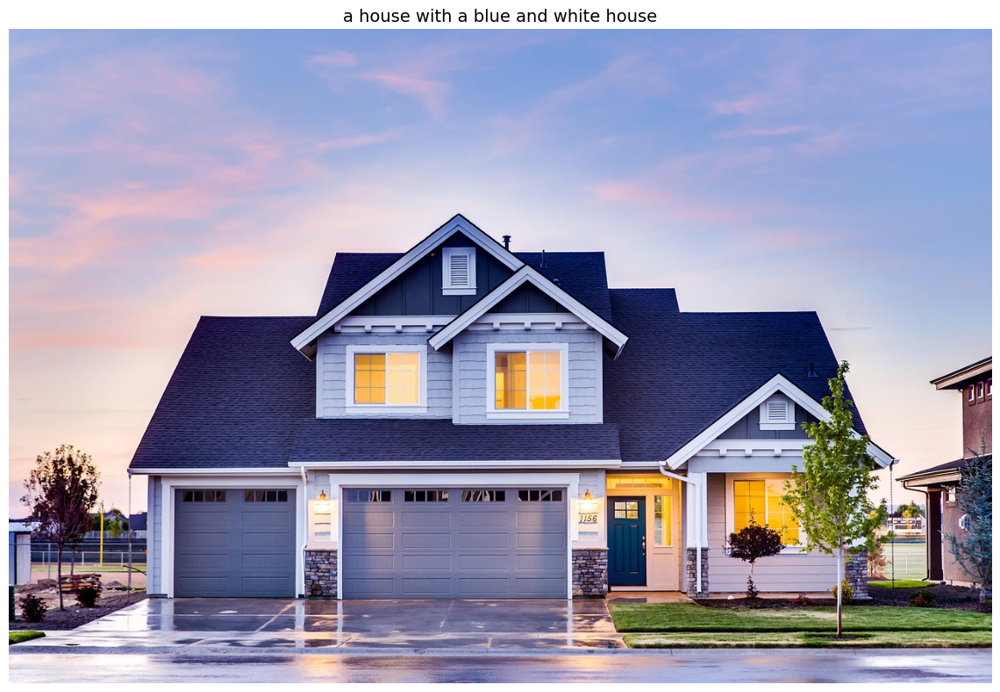

Caption: a house with a blue and white house
--------------------------------------------------


In [7]:
# Test with some sample images
image_urls = [
    "https://cdn.pixabay.com/photo/2017/02/20/18/03/cat-2083492_1280.jpg",
    "https://cdn.pixabay.com/photo/2017/07/31/11/21/people-2557399_1280.jpg",
    "https://cdn.pixabay.com/photo/2016/11/18/17/46/house-1836070_1280.jpg"
]

# Process each image
for url in image_urls:
    # Load image
    image = load_image(url)

    # Generate caption
    caption = generate_caption(image)

    # Display image with caption
    display_image_with_caption(image, caption)
    print(f"Caption: {caption}")
    print("-" * 50)

**Allow for uploading your own images**

Saving istockphoto-482140832-612x612.jpg to istockphoto-482140832-612x612 (2).jpg


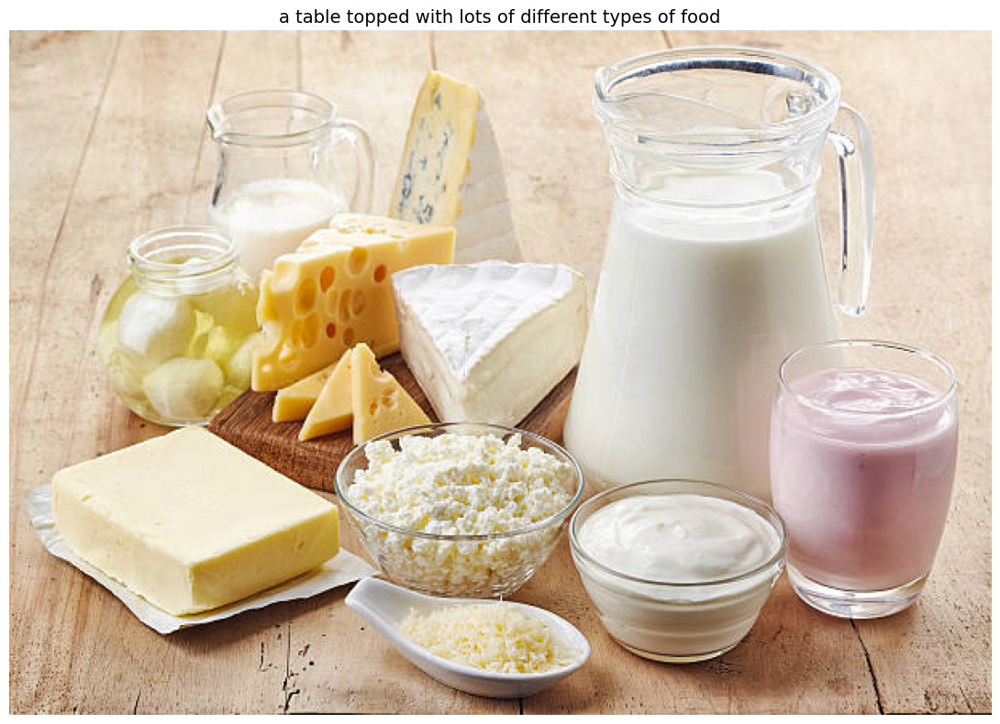

Caption: a table topped with lots of different types of food


In [11]:
from google.colab import files
import io

# Upload an image
uploaded = files.upload()

for filename in uploaded.keys():
    # Load the uploaded image
    image = Image.open(io.BytesIO(uploaded[filename]))

    # Generate caption
    caption = generate_caption(image)

    # Display image with caption
    display_image_with_caption(image, caption)
    print(f"Caption: {caption}")

**Create a more comprehensive test with multiple images**

Use a mix of different types: people, nature, objects, etc.

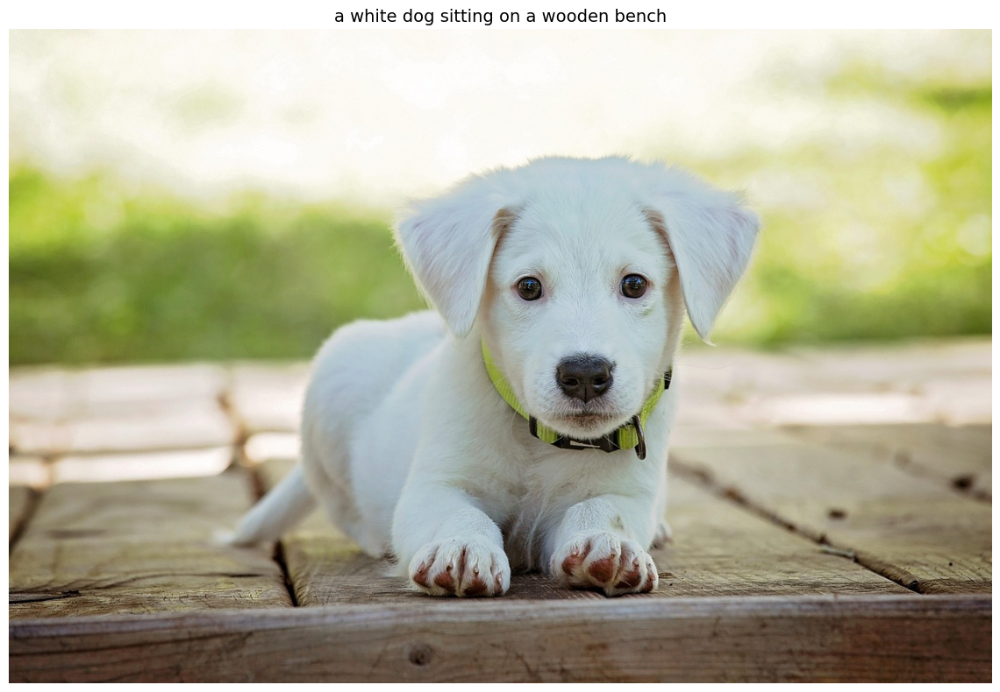

Image 1: a white dog sitting on a wooden bench
--------------------------------------------------


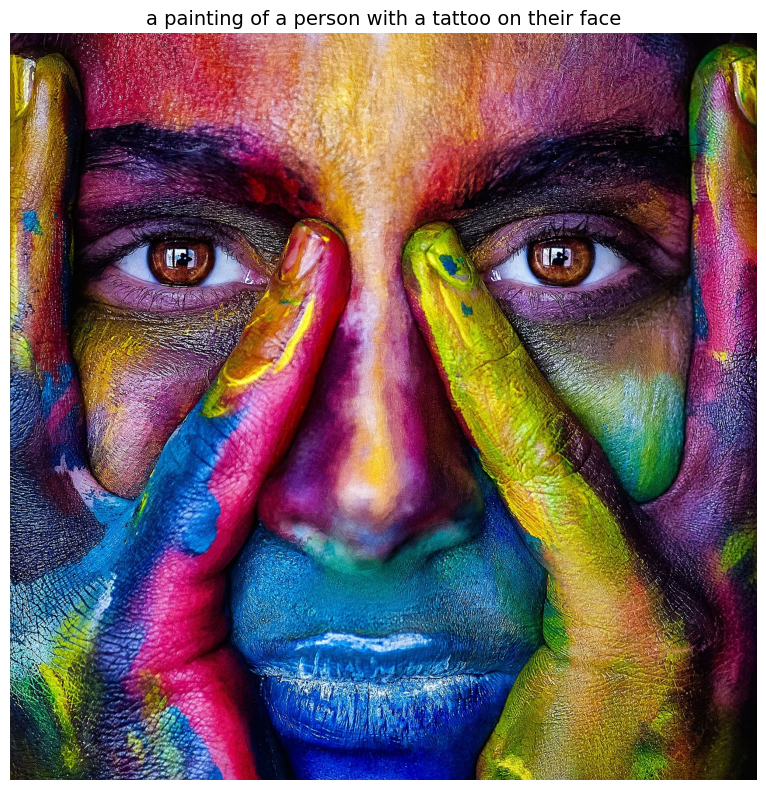

Image 2: a painting of a person with a tattoo on their face
--------------------------------------------------


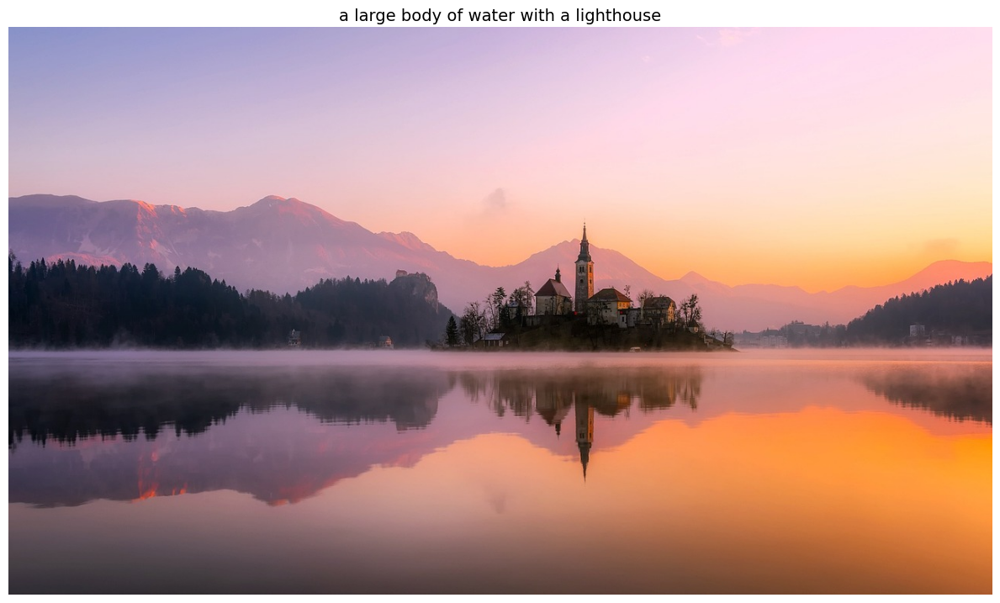

Image 3: a large body of water with a lighthouse
--------------------------------------------------


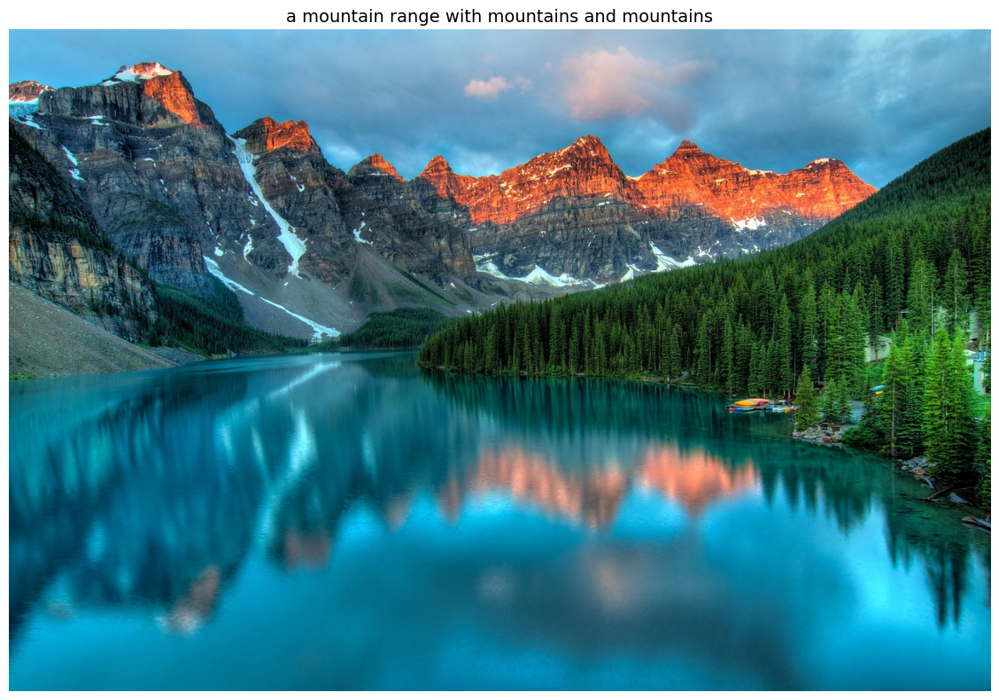

Image 4: a mountain range with mountains and mountains
--------------------------------------------------


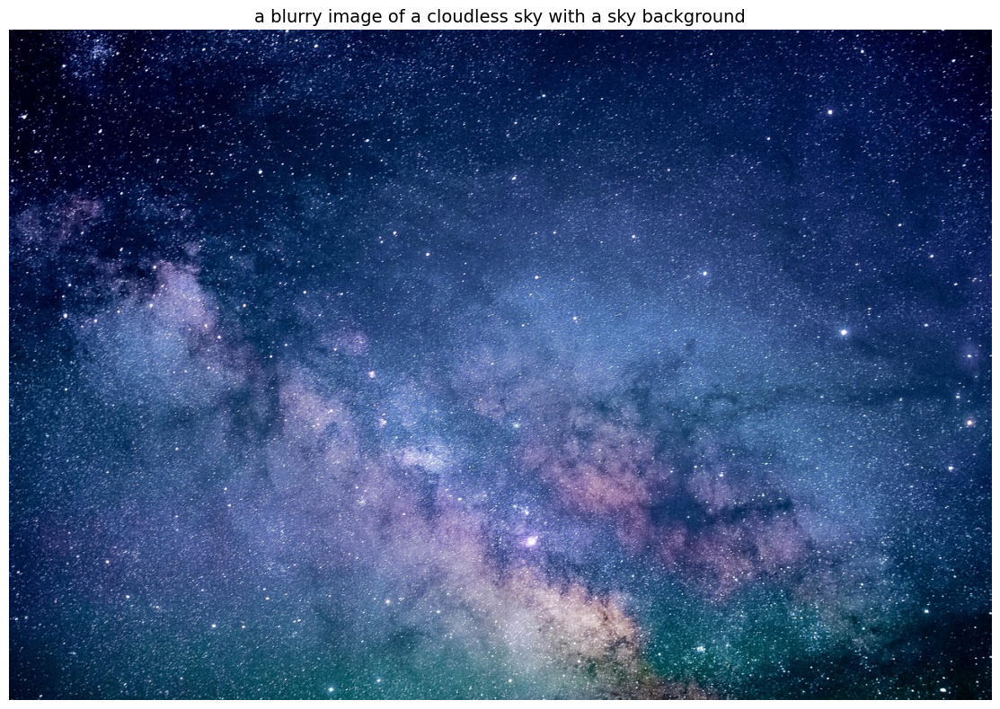

Image 5: a blurry image of a cloudless sky with a sky background
--------------------------------------------------

Summary of all captions:
Image 1: a white dog sitting on a wooden bench
Image 2: a painting of a person with a tattoo on their face
Image 3: a large body of water with a lighthouse
Image 4: a mountain range with mountains and mountains
Image 5: a blurry image of a cloudless sky with a sky background


In [8]:
# Create a more comprehensive test with multiple images
# Use a mix of different types: people, nature, objects, etc.

test_image_urls = [
    "https://cdn.pixabay.com/photo/2016/12/13/05/15/puppy-1903313_1280.jpg",
    "https://cdn.pixabay.com/photo/2017/08/30/12/45/girl-2696947_1280.jpg",
    "https://cdn.pixabay.com/photo/2017/01/19/23/46/panorama-1993645_1280.jpg",
    "https://cdn.pixabay.com/photo/2017/05/09/03/46/alberta-2297204_1280.jpg",
    "https://cdn.pixabay.com/photo/2016/11/29/05/45/astronomy-1867616_1280.jpg"
]

results = []

# Process each image and collect results
for i, url in enumerate(test_image_urls):
    # Load image
    image = load_image(url)

    # Generate caption
    caption = generate_caption(image)

    # Display image with caption
    display_image_with_caption(image, caption)

    # Store result
    results.append({
        "image_id": i+1,
        "url": url,
        "caption": caption
    })

    print(f"Image {i+1}: {caption}")
    print("-" * 50)

# Print a summary of all captions
print("\nSummary of all captions:")
for res in results:
    print(f"Image {res['image_id']}: {res['caption']}")